# K-space Verisinden IVIM Parametre Tahmini

Bu notebook, k-space verisinden IVIM parametrelerini (f, D*, Dt) tahmin etmek için:
1. **PIA Model** (eğitilmiş model `/workspaces/PIA-IVIM/pia_runs`)
2. **NLLS Fitting** (Non-linear Least Squares - `/workspaces/PIA-IVIM/utils.py`)

yöntemlerini karşılaştırır.

## Metrikler
- **MAE** (Mean Absolute Error): Ortalama mutlak hata
- **Bias**: Ortalama hata (pred - gt), sistematik sapma
- **Spearman Correlation**: Sıralama korelasyonu
- **RMSE**: Root mean squared error
- **rRMSE**: Relative RMSE (Challenge metriği)
- **R²**: Determination coefficient

## Çıktılar
- Parametre haritaları (GT, PIA, NLLS)
- Hata haritaları (absolute error)
- Bias haritaları (signed error)
- Scatter plotlar
- Detaylı metrik karşılaştırmaları

## 1. Kütüphaneleri Yükle

In [1]:
import numpy as np
import torch
import torch.nn.functional as F
from scipy.optimize import curve_fit
from scipy.stats import spearmanr
import matplotlib.pyplot as plt
from tqdm import tqdm
import time
import glob
import os
import pandas as pd

from PIA import PIA
from utils import hybrid_fit, ivim_fit_func

print("✅ Kütüphaneler yüklendi")
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")

✅ Kütüphaneler yüklendi
PyTorch version: 2.9.1+cu128
CUDA available: False


## 2. Yardımcı Fonksiyonlar

In [2]:
def kspace_to_image(kspace_data):
    """
    K-space verisinden image domain'e dönüşüm (Inverse FFT)
    
    Args:
        kspace_data: Complex k-space data [H, W, num_b_values]
    
    Returns:
        image_data: Complex image data [H, W, num_b_values]
    """
    # 2D Inverse FFT (spatial dimensions için)
    image_data = np.fft.ifft2(kspace_data, axes=(0, 1))
    # FFT shift (k-space center'ı düzeltmek için)
    image_data = np.fft.ifftshift(image_data, axes=(0, 1))
    
    return image_data


def preprocess_signals(image_data, normalize=True):
    """
    Image domain verisini sinyal olarak hazırla
    
    Args:
        image_data: Complex image data [H, W, num_b_values]
        normalize: b=0'a göre normalize et
    
    Returns:
        signals: Magnitude signals [H, W, num_b_values]
    """
    # Magnitude al (complex -> real)
    signals = np.abs(image_data)
    
    # Normalize (opsiyonel ama önerilen)
    if normalize:
        b0 = signals[:, :, 0:1]  # b=0 frame
        # 0'a bölme hatasını önle
        signals = signals / np.clip(b0, 1e-8, None)
    
    return signals


def predict_with_pia(signals, model, device='cuda', batch_size=2048):
    """
    PIA modeli ile parametre tahmini
    
    Args:
        signals: [H, W, num_b_values]
        model: PIA model
        device: 'cuda' or 'cpu'
        batch_size: Batch boyutu
    
    Returns:
        f_pred, Dt_pred, Dstar_pred: [H, W]
    """
    H, W, num_b = signals.shape
    
    # Reshape: [H*W, num_b_values]
    signals_flat = signals.reshape(-1, num_b)
    
    # Tensor'e çevir
    signals_tensor = torch.from_numpy(signals_flat).float().to(device)
    
    # Batch processing
    num_samples = signals_flat.shape[0]
    f_pred_list = []
    Dt_pred_list = []
    Dstar_pred_list = []
    
    model.eval()
    with torch.no_grad():
        for i in tqdm(range(0, num_samples, batch_size), desc="PIA Prediction"):
            batch = signals_tensor[i:i+batch_size]
            f_batch, Dt_batch, Dstar_batch = model.encode(batch)
            
            f_pred_list.append(f_batch.cpu().numpy())
            Dt_pred_list.append(Dt_batch.cpu().numpy())
            Dstar_pred_list.append(Dstar_batch.cpu().numpy())
    
    # Concatenate ve reshape
    f_pred = np.concatenate(f_pred_list, axis=0).reshape(H, W)
    Dt_pred = np.concatenate(Dt_pred_list, axis=0).reshape(H, W)
    Dstar_pred = np.concatenate(Dstar_pred_list, axis=0).reshape(H, W)
    
    return f_pred, Dt_pred, Dstar_pred


def predict_with_nlls(signals, b_values=[0, 5, 50, 100, 200, 500, 800, 1000]):
    """
    NLLS fitting ile parametre tahmini
    
    Args:
        signals: [H, W, num_b_values]
        b_values: b-value listesi
    
    Returns:
        f_pred, Dt_pred, Dstar_pred: [H, W]
    """
    H, W, num_b = signals.shape
    
    # Reshape: [H*W, num_b_values]
    signals_flat = signals.reshape(-1, num_b)
    
    # NLLS fitting (her voxel için)
    print("NLLS fitting yapılıyor...")
    f_pred, Dt_pred, Dstar_pred = hybrid_fit(signals_flat, bvals=b_values)
    
    # Reshape back to image
    f_pred = f_pred.reshape(H, W)
    Dt_pred = Dt_pred.reshape(H, W)
    Dstar_pred = Dstar_pred.reshape(H, W)
    
    return f_pred, Dt_pred, Dstar_pred


def compute_metrics(pred, gt, mask=None):
    """
    Tahmin metriklerini hesapla
    
    Args:
        pred: Tahmin edilen değerler [H, W]
        gt: Ground truth değerler [H, W]
        mask: Maske (opsiyonel) [H, W]
    
    Returns:
        metrics: Dict of metrics
    """
    if mask is not None:
        pred = pred[mask]
        gt = gt[mask]
    else:
        pred = pred.flatten()
        gt = gt.flatten()
    
    # Remove invalid values
    valid = ~(np.isnan(pred) | np.isnan(gt) | np.isinf(pred) | np.isinf(gt))
    pred = pred[valid]
    gt = gt[valid]
    
    # Metrics
    mae = np.mean(np.abs(pred - gt))
    mse = np.mean((pred - gt) ** 2)
    rmse = np.sqrt(mse)
    
    # Bias (mean error)
    bias = np.mean(pred - gt)
    
    # Relative RMSE (challenge metric)
    rrmse = rmse / (np.mean(gt) + 1e-8)
    
    # R-squared
    ss_res = np.sum((gt - pred) ** 2)
    ss_tot = np.sum((gt - np.mean(gt)) ** 2)
    r2 = 1 - (ss_res / (ss_tot + 1e-8))
    
    # Spearman correlation
    from scipy.stats import spearmanr
    spearman_corr, spearman_pval = spearmanr(gt, pred)
    
    return {
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'Bias': bias,
        'rRMSE': rrmse,
        'R2': r2,
        'Spearman_Corr': spearman_corr,
        'Spearman_PVal': spearman_pval
    }

print("✅ Fonksiyonlar tanımlandı")

✅ Fonksiyonlar tanımlandı


## 3. Veriyi Yükle ve İncele

In [4]:
# Veriyi yükle
case_id = '0001'
print(f"Vaka ID: {case_id}")

noisy_kspace = np.load(f'data/{case_id}_NoisyDWIk.npy')
gt_params = np.load(f'data/{case_id}_IVIMParam.npy')
gt_dwis = np.load(f'data/{case_id}_gtDWIs.npy')
tissue_type = np.load(f'data/{case_id}_TissueType.npy')

# ⚠️ CRITICAL FIX: Ground truth parametrelerini birim dönüşümü yap
# GT verisi mm²/s biriminde, ancak PIA modeli 10^-3 mm²/s biriminde çalışıyor
# D* ve Dt'yi 1000 ile çarpıyoruz (mm²/s -> 10^-3 mm²/s)
gt_params[:, :, 1] = gt_params[:, :, 1] * 1000  # Dt (pseudo-diffusion)
gt_params[:, :, 2] = gt_params[:, :, 2] * 1000  # D* (tissue diffusion)

print(f"\n📊 Veri Boyutları:")
print(f"   NoisyDWIk (k-space):  {noisy_kspace.shape}, dtype: {noisy_kspace.dtype}")
print(f"   IVIMParam (GT):       {gt_params.shape}, dtype: {gt_params.dtype}")
print(f"   gtDWIs:               {gt_dwis.shape}, dtype: {gt_dwis.dtype}")
print(f"   TissueType:           {tissue_type.shape}, dtype: {tissue_type.dtype}")

print(f"\n📈 K-space İstatistikleri:")
print(f"   Is complex: {np.iscomplexobj(noisy_kspace)}")
print(f"   Magnitude mean: {np.abs(noisy_kspace).mean():.6f}")
print(f"   Magnitude std:  {np.abs(noisy_kspace).std():.6f}")

print(f"\n📈 Ground Truth IVIM Parametreleri (10^-3 mm²/s biriminde):")
for i, name in enumerate(['f', 'Dt', 'D*']):
    param = gt_params[:, :, i]
    print(f"   {name:3s}: min={param.min():.6f}, max={param.max():.6f}, mean={param.mean():.6f}")

# Doku tipi dağılımı
print(f"\n📈 Tissue Type Dağılımı:")
for val in np.unique(tissue_type):
    count = np.sum(tissue_type == val)
    percentage = 100 * count / tissue_type.size
    print(f"   Type {val}: {count:5d} voxels ({percentage:5.2f}%)")

Vaka ID: 0001

📊 Veri Boyutları:
   NoisyDWIk (k-space):  (200, 200, 8), dtype: complex128
   IVIMParam (GT):       (200, 200, 3), dtype: float64
   gtDWIs:               (200, 200, 8), dtype: complex128
   TissueType:           (200, 200), dtype: int32

📈 K-space İstatistikleri:
   Is complex: True
   Magnitude mean: 0.047395
   Magnitude std:  0.177852

📈 Ground Truth IVIM Parametreleri (10^-3 mm²/s biriminde):
   f  : min=0.000000, max=0.312934, mean=0.015412
   Dt : min=0.000000, max=2.090000, mean=0.697224
   D* : min=0.000000, max=59.110015, mean=5.034604

📈 Tissue Type Dağılımı:
   Type 1: 21809 voxels (54.52%)
   Type 2:  2098 voxels ( 5.25%)
   Type 3:   755 voxels ( 1.89%)
   Type 4: 12182 voxels (30.45%)
   Type 5:  3009 voxels ( 7.52%)
   Type 6:    30 voxels ( 0.07%)
   Type 7:    88 voxels ( 0.22%)
   Type 8:    29 voxels ( 0.07%)


## 4. K-space → Image Domain Dönüşümü

In [5]:
# K-space'den image domain'e dönüşüm
print("K-space -> Image domain (Inverse FFT)...")
image_data = kspace_to_image(noisy_kspace)
print(f"Image data shape: {image_data.shape}")
print(f"Is complex: {np.iscomplexobj(image_data)}")

# Preprocess: magnitude + normalize
print("\nPreprocessing (magnitude + normalize to b=0)...")
signals = preprocess_signals(image_data, normalize=True)
print(f"Signals shape: {signals.shape}")
print(f"Signals range: [{signals.min():.4f}, {signals.max():.4f}]")
print(f"Mean signal: {signals.mean():.4f}")

K-space -> Image domain (Inverse FFT)...
Image data shape: (200, 200, 8)
Is complex: True

Preprocessing (magnitude + normalize to b=0)...
Signals shape: (200, 200, 8)
Signals range: [0.0023, 812.4137]
Mean signal: 1.1442


## 5. Sinyalleri Görselleştir

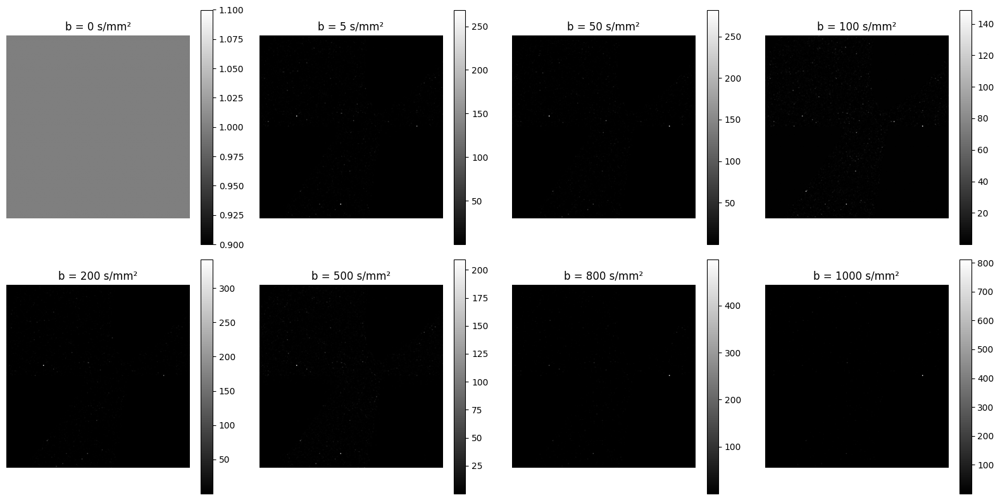

In [6]:
# Farklı b-değerlerindeki sinyalleri görselleştir
b_values = [0, 5, 50, 100, 200, 500, 800, 1000]

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()

for i, b in enumerate(b_values):
    im = axes[i].imshow(signals[:, :, i], cmap='gray')
    axes[i].set_title(f'b = {b} s/mm²')
    axes[i].axis('off')
    plt.colorbar(im, ax=axes[i])

plt.tight_layout()
plt.show()

## 6. PIA Model Yükle

In [7]:
# Device ayarla
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Device: {device}")

# Mevcut checkpoint'leri listele
checkpoints = []
for pattern in ['pia_runs/**/best_high_noise.pt', 'pia_runs/**/final_model.pt', 'pia_runs/**/checkpoint_*.pt']:
    checkpoints.extend(glob.glob(pattern, recursive=True))

checkpoints = sorted(set(checkpoints))

print(f"\n📁 Mevcut Model Checkpoint'leri ({len(checkpoints)} adet):")
for i, cp in enumerate(checkpoints):
    size = os.path.getsize(cp) / (1024 * 1024)  # MB
    print(f"   {i}: {cp} ({size:.2f} MB)")

Device: cpu

📁 Mevcut Model Checkpoint'leri (4 adet):
   0: pia_runs/exp2_balanced_weighted/best_high_noise.pt (56.19 MB)
   1: pia_runs/exp2_balanced_weighted/final_model.pt (18.73 MB)
   2: pia_runs/exp3_finetune_balanced/checkpoint_step50000.pt (56.19 MB)
   3: pia_runs/exp3_finetune_balanced/checkpoint_step62500.pt (56.19 MB)


In [8]:
# Kullanılacak checkpoint'i seç
checkpoint_idx = 0  # Varsayılan olarak ilk checkpoint
checkpoint_path = checkpoints[checkpoint_idx]

print(f"Seçilen checkpoint: {checkpoint_path}")

# Checkpoint'i yükle (eğitim parametrelerini al)
checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)

# Eğitim args'larını al
train_args = checkpoint.get('args', {})
predictor_depth = train_args.get('predictor_depth', 1)

print(f"\nEğitim parametreleri:")
print(f"   predictor_depth: {predictor_depth}")
print(f"   batch_size: {train_args.get('batch_size', 'N/A')}")
print(f"   lr: {train_args.get('lr', 'N/A')}")

# Model oluştur (checkpoint'teki parametrelerle)
model = PIA(
    number_of_signals=8,
    f_mean=0.5,           # PIA.py default
    Dt_mean=1.45,         # PIA.py default
    Dstar_mean=30.0,      # PIA.py default
    f_delta=0.5,          # PIA.py default
    Dt_delta=1.45,        # PIA.py default
    Dstar_delta=30.0,     # PIA.py default
    b_values=b_values,
    predictor_depth=predictor_depth,  # Checkpoint'ten
    device=device
)

# Model state'i yükle
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

print(f"\n✅ Model yüklendi!")
print(f"   Step: {checkpoint.get('step', 'N/A')}")
print(f"   Best score: {checkpoint.get('best_high_noise_score', 'N/A')}")

Seçilen checkpoint: pia_runs/exp2_balanced_weighted/best_high_noise.pt

Eğitim parametreleri:
   predictor_depth: 6
   batch_size: 64
   lr: 0.0003

✅ Model yüklendi!
   Step: 48000
   Best score: 0.2352996996636021


## 7. PIA Model ile Tahmin

In [9]:
print("PIA modeli ile parametre tahmini yapılıyor...")
start_time = time.time()

f_pia, Dt_pia, Dstar_pia = predict_with_pia(
    signals, 
    model, 
    device=device, 
    batch_size=64
)

pia_time = time.time() - start_time

print(f"\n✅ PIA tahmini tamamlandı!")
print(f"   Süre: {pia_time:.2f} saniye")
print(f"\nTahmin Edilen Değer Aralıkları:")
print(f"   f      (PIA): [{f_pia.min():.6f}, {f_pia.max():.6f}], mean={f_pia.mean():.6f}")
print(f"   Dt     (PIA): [{Dt_pia.min():.6f}, {Dt_pia.max():.6f}], mean={Dt_pia.mean():.6f}")
print(f"   D*     (PIA): [{Dstar_pia.min():.6f}, {Dstar_pia.max():.6f}], mean={Dstar_pia.mean():.6f}")

PIA modeli ile parametre tahmini yapılıyor...


PIA Prediction:  67%|██████▋   | 421/625 [00:04<00:01, 108.15it/s]

PIA Prediction: 100%|██████████| 625/625 [00:06<00:00, 90.77it/s] 


✅ PIA tahmini tamamlandı!
   Süre: 6.90 saniye

Tahmin Edilen Değer Aralıkları:
   f      (PIA): [0.000000, 1.000000], mean=0.235712
   Dt     (PIA): [0.000000, 2.327234], mean=0.849268
   D*     (PIA): [0.000008, 60.000000], mean=28.762478


## 8. NLLS Fitting ile Tahmin

In [10]:
print("NLLS fitting ile parametre tahmini yapılıyor...")
print("⚠️  Bu işlem uzun sürebilir (birkaç dakika)...")

start_time = time.time()

f_nlls, Dt_nlls, Dstar_nlls = predict_with_nlls(
    signals, 
    b_values=b_values
)

nlls_time = time.time() - start_time

print(f"\n✅ NLLS tahmini tamamlandı!")
print(f"   Süre: {nlls_time:.2f} saniye")
print(f"\nTahmin Edilen Değer Aralıkları:")
print(f"   f      (NLLS): [{f_nlls.min():.6f}, {f_nlls.max():.6f}], mean={f_nlls.mean():.6f}")
print(f"   Dt     (NLLS): [{Dt_nlls.min():.6f}, {Dt_nlls.max():.6f}], mean={Dt_nlls.mean():.6f}")
print(f"   D*     (NLLS): [{Dstar_nlls.min():.6f}, {Dstar_nlls.max():.6f}], mean={Dstar_nlls.mean():.6f}")

print(f"\n⏱️  Hız Karşılaştırması:")
print(f"   PIA:  {pia_time:.2f}s")
print(f"   NLLS: {nlls_time:.2f}s")
print(f"   Speedup: {nlls_time/pia_time:.1f}x daha hızlı (PIA)")

NLLS fitting ile parametre tahmini yapılıyor...
⚠️  Bu işlem uzun sürebilir (birkaç dakika)...
NLLS fitting yapılıyor...


: 

## 9. Sonuçları Görselleştir

✅ Görsel kaydedildi: results_0001_comparison.png


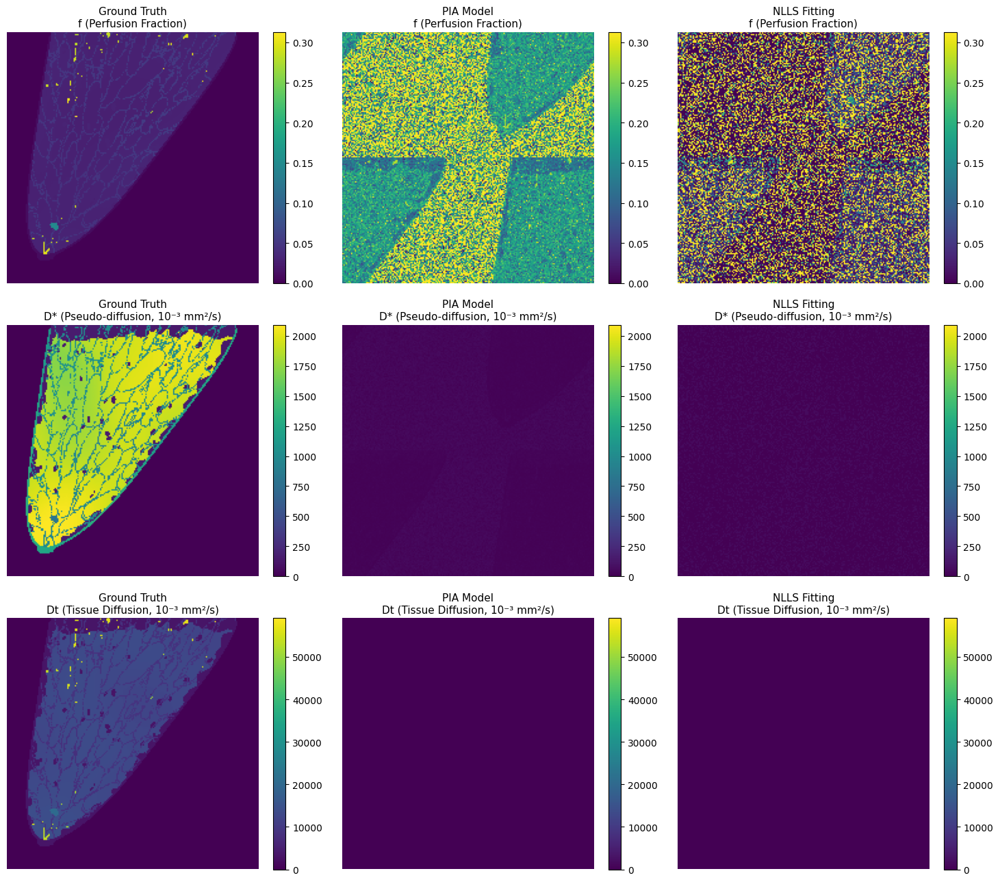

In [ ]:
# Ground truth ve tahminleri görselleştir
param_names = ['f (Perfusion Fraction)', 'D* (Pseudo-diffusion, 10⁻³ mm²/s)', 'Dt (Tissue Diffusion, 10⁻³ mm²/s)']
gt_params_list = [gt_params[:, :, 0], gt_params[:, :, 1]*1000, gt_params[:, :, 2]*1000]

pia_params_list = [f_pia, Dt_pia, Dstar_pia ]
nlls_params_list = [f_nlls, Dt_nlls, Dstar_nlls, ]

fig, axes = plt.subplots(3, 3, figsize=(15, 13))

for i in range(3):
    # Ground truth
    vmin, vmax = gt_params_list[i].min(), gt_params_list[i].max()
    
    im0 = axes[i, 0].imshow(gt_params_list[i], cmap='viridis', vmin=vmin, vmax=vmax)
    axes[i, 0].set_title(f'Ground Truth\n{param_names[i]}', fontsize=11)
    axes[i, 0].axis('off')
    plt.colorbar(im0, ax=axes[i, 0], fraction=0.046)
    
    # PIA prediction
    im1 = axes[i, 1].imshow(pia_params_list[i], cmap='viridis', vmin=vmin, vmax=vmax)
    axes[i, 1].set_title(f'PIA Model\n{param_names[i]}', fontsize=11)
    axes[i, 1].axis('off')
    plt.colorbar(im1, ax=axes[i, 1], fraction=0.046)
    
    # NLLS prediction
    im2 = axes[i, 2].imshow(nlls_params_list[i], cmap='viridis', vmin=vmin, vmax=vmax)
    axes[i, 2].set_title(f'NLLS Fitting\n{param_names[i]}', fontsize=11)
    axes[i, 2].axis('off')
    plt.colorbar(im2, ax=axes[i, 2], fraction=0.046)

plt.tight_layout()
plt.savefig(f'results_{case_id}_comparison.png', dpi=150, bbox_inches='tight')
print(f"✅ Görsel kaydedildi: results_{case_id}_comparison.png")
plt.show()

## 10. Hata Haritalarını Görselleştir

✅ Hata haritası kaydedildi: results_0001_errors.png


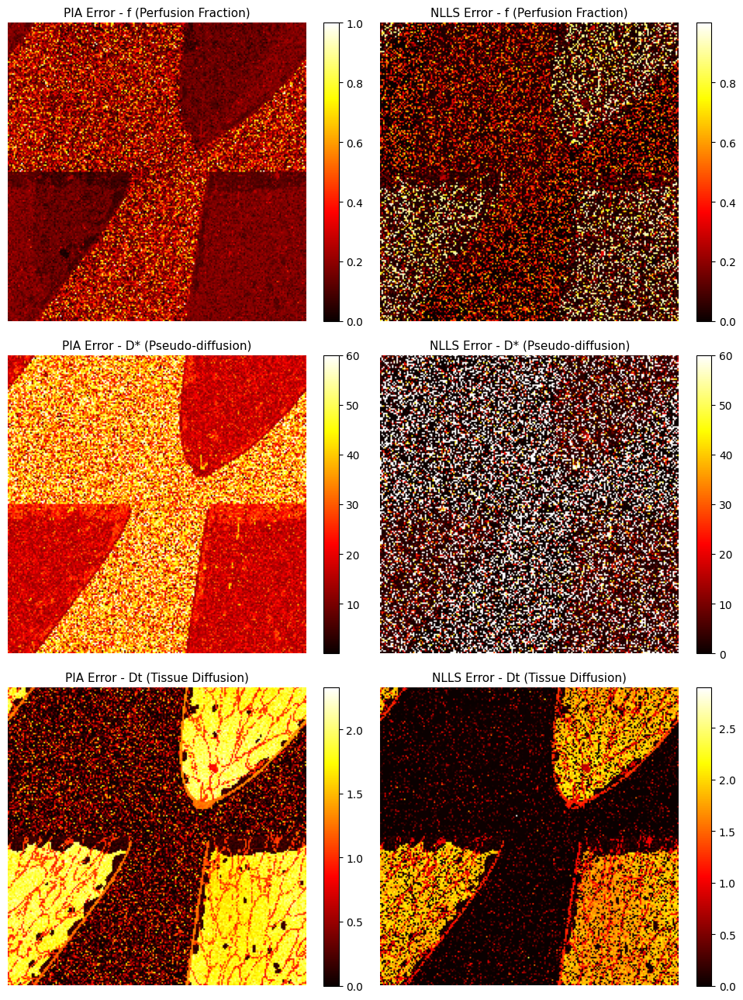

In [13]:
# Error maps (absolute error)
fig, axes = plt.subplots(3, 2, figsize=(10, 13))

for i in range(3):
    # PIA error
    error_pia = np.abs(pia_params_list[i] - gt_params_list[i])
    im0 = axes[i, 0].imshow(error_pia, cmap='hot')
    axes[i, 0].set_title(f'PIA Error - {param_names[i]}', fontsize=11)
    axes[i, 0].axis('off')
    plt.colorbar(im0, ax=axes[i, 0], fraction=0.046)
    
    # NLLS error
    error_nlls = np.abs(nlls_params_list[i] - gt_params_list[i])
    im1 = axes[i, 1].imshow(error_nlls, cmap='hot')
    axes[i, 1].set_title(f'NLLS Error - {param_names[i]}', fontsize=11)
    axes[i, 1].axis('off')
    plt.colorbar(im1, ax=axes[i, 1], fraction=0.046)

plt.tight_layout()
plt.savefig(f'results_{case_id}_errors.png', dpi=150, bbox_inches='tight')
print(f"✅ Hata haritası kaydedildi: results_{case_id}_errors.png")
plt.show()

## 10b. Bias Haritalarını Görselleştir

✅ Bias haritası kaydedildi: results_0001_bias.png


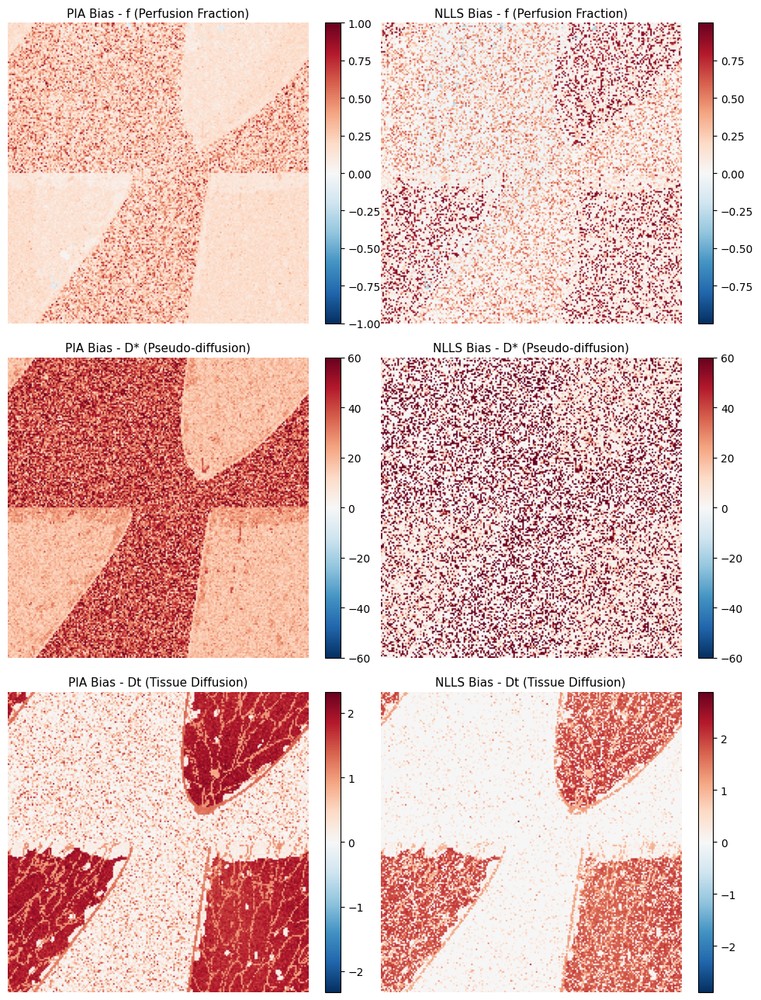

In [14]:
# Bias maps (signed error: pred - gt)
fig, axes = plt.subplots(3, 2, figsize=(10, 13))

for i in range(3):
    # PIA bias
    bias_pia = pia_params_list[i] - gt_params_list[i]
    vmax = max(abs(bias_pia.min()), abs(bias_pia.max()))
    im0 = axes[i, 0].imshow(bias_pia, cmap='RdBu_r', vmin=-vmax, vmax=vmax)
    axes[i, 0].set_title(f'PIA Bias - {param_names[i]}', fontsize=11)
    axes[i, 0].axis('off')
    plt.colorbar(im0, ax=axes[i, 0], fraction=0.046)
    
    # NLLS bias
    bias_nlls = nlls_params_list[i] - gt_params_list[i]
    vmax = max(abs(bias_nlls.min()), abs(bias_nlls.max()))
    im1 = axes[i, 1].imshow(bias_nlls, cmap='RdBu_r', vmin=-vmax, vmax=vmax)
    axes[i, 1].set_title(f'NLLS Bias - {param_names[i]}', fontsize=11)
    axes[i, 1].axis('off')
    plt.colorbar(im1, ax=axes[i, 1], fraction=0.046)

plt.tight_layout()
plt.savefig(f'results_{case_id}_bias.png', dpi=150, bbox_inches='tight')
print(f"✅ Bias haritası kaydedildi: results_{case_id}_bias.png")
plt.show()

## 11. Metrikleri Hesapla

In [15]:
# Non-zero mask (arka planı hariç tut)
mask = tissue_type > 0

print("="*80)
print("PERFORMANS METRİKLERİ")
print("="*80)

param_labels = ['f', 'D*', 'Dt']

print("\n" + "="*40)
print("PIA MODEL METRİKLERİ")
print("="*40)

for i, label in enumerate(param_labels):
    metrics = compute_metrics(pia_params_list[i], gt_params_list[i], mask=mask)
    print(f"\n{label} (Perfusion Fraction)" if label == 'f' else 
          f"\n{label} (Pseudo-diffusion)" if label == 'D*' else 
          f"\n{label} (Tissue Diffusion)")
    print("-" * 40)
    for metric_name, value in metrics.items():
        print(f"  {metric_name:16s}: {value:.6f}")

print("\n" + "="*40)
print("NLLS FITTING METRİKLERİ")
print("="*40)

for i, label in enumerate(param_labels):
    metrics = compute_metrics(nlls_params_list[i], gt_params_list[i], mask=mask)
    print(f"\n{label} (Perfusion Fraction)" if label == 'f' else 
          f"\n{label} (Pseudo-diffusion)" if label == 'D*' else 
          f"\n{label} (Tissue Diffusion)")
    print("-" * 40)
    for metric_name, value in metrics.items():
        print(f"  {metric_name:16s}: {value:.6f}")

PERFORMANS METRİKLERİ

PIA MODEL METRİKLERİ

f (Perfusion Fraction)
----------------------------------------
  MAE             : 0.221028
  MSE             : 0.073636
  RMSE            : 0.271360
  Bias            : 0.220300
  rRMSE           : 17.607443
  R2              : -137.687771
  Spearman_Corr   : 0.026907
  Spearman_PVal   : 0.000000

D* (Pseudo-diffusion)
----------------------------------------
  MAE             : 28.761779
  MSE             : 1021.270339
  RMSE            : 31.957321
  Bias            : 28.761779
  rRMSE           : 45834.405795
  R2              : -1348417555.278355
  Spearman_Corr   : 0.029114
  Spearman_PVal   : 0.000000

Dt (Tissue Diffusion)
----------------------------------------
  MAE             : 0.845342
  MSE             : 1.302404
  RMSE            : 1.141229
  Bias            : 0.844233
  rRMSE           : 226.676612
  R2              : -30747.365812
  Spearman_Corr   : -0.058196
  Spearman_PVal   : 0.000000

NLLS FITTING METRİKLERİ

f (Perfus

## 12. Metrik Karşılaştırma Tablosu

In [16]:
# Metrik karşılaştırma tablosu oluştur
comparison_data = []

for i, label in enumerate(param_labels):
    metrics_pia = compute_metrics(pia_params_list[i], gt_params_list[i], mask=mask)
    metrics_nlls = compute_metrics(nlls_params_list[i], gt_params_list[i], mask=mask)
    
    for metric_name in ['MAE', 'Bias', 'RMSE', 'rRMSE', 'R2', 'Spearman_Corr']:
        comparison_data.append({
            'Parameter': label,
            'Metric': metric_name,
            'PIA': metrics_pia[metric_name],
            'NLLS': metrics_nlls[metric_name],
            'Diff (NLLS-PIA)': metrics_nlls[metric_name] - metrics_pia[metric_name]
        })

df_comparison = pd.DataFrame(comparison_data)

print("\n" + "="*80)
print("DETAYLI METRİK KARŞILAŞTIRMASI")
print("="*80)
print(df_comparison.to_string(index=False))

# CSV olarak kaydet
df_comparison.to_csv(f'metrics_comparison_{case_id}.csv', index=False)
print(f"\n✅ Metrikler kaydedildi: metrics_comparison_{case_id}.csv")

# Pivot table oluştur (daha okunaklı)
print("\n" + "="*80)
print("METRİK ÖZETİ (Pivot Table)")
print("="*80)
for metric in ['MAE', 'Bias', 'Spearman_Corr']:
    print(f"\n{metric}:")
    pivot = df_comparison[df_comparison['Metric'] == metric].pivot_table(
        values=['PIA', 'NLLS', 'Diff (NLLS-PIA)'], 
        index='Parameter', 
        aggfunc='first'
    )
    print(pivot.to_string())


DETAYLI METRİK KARŞILAŞTIRMASI
Parameter        Metric           PIA          NLLS  Diff (NLLS-PIA)
        f           MAE  2.210284e-01  1.861744e-01    -3.485400e-02
        f          Bias  2.202999e-01  1.726870e-01    -4.761284e-02
        f          RMSE  2.713597e-01  3.280831e-01     5.672343e-02
        f         rRMSE  1.760744e+01  2.128800e+01     3.680556e+00
        f            R2 -1.376878e+02 -2.017287e+02    -6.404095e+01
        f Spearman_Corr  2.690672e-02 -1.377178e-02    -4.067849e-02
       D*           MAE  2.876178e+01  1.860898e+01    -1.015280e+01
       D*          Bias  2.876178e+01  1.860860e+01    -1.015318e+01
       D*          RMSE  3.195732e+01  3.116272e+01    -7.946001e-01
       D*         rRMSE  4.583441e+04  4.469476e+04    -1.139646e+03
       D*            R2 -1.348418e+09 -1.282196e+09     6.622158e+07
       D* Spearman_Corr  2.911407e-02 -1.060105e-02    -3.971512e-02
       Dt           MAE  8.453422e-01  5.636343e-01    -2.817079e-01
  

## 12b. Detaylı Parametre Haritaları (Her Parametre İçin)

✅ Detaylı f haritası kaydedildi: results_0001_f_detailed.png


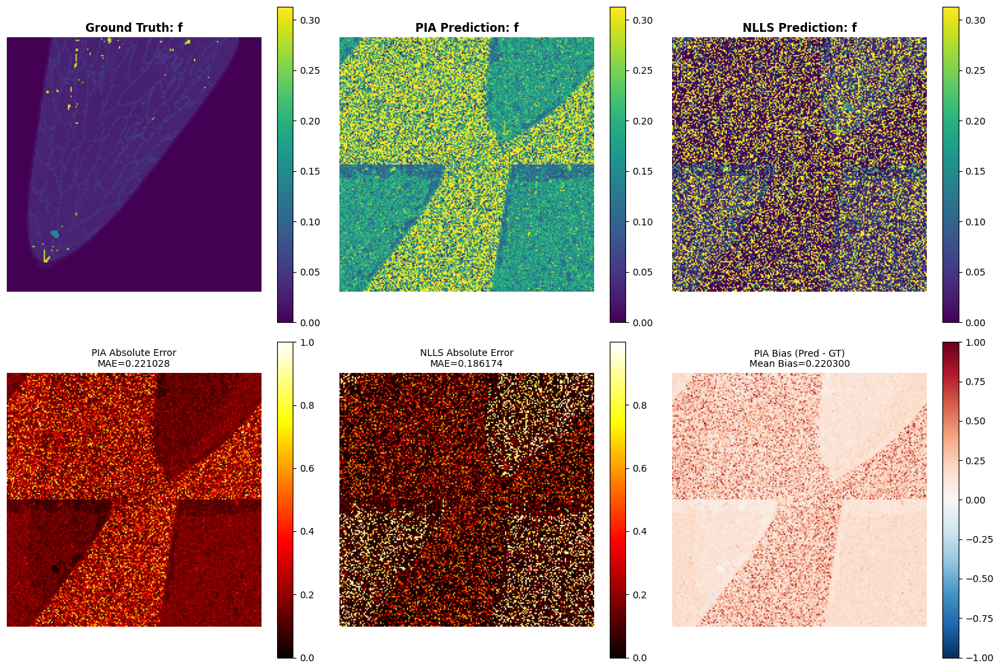

✅ Detaylı D* haritası kaydedildi: results_0001_D*_detailed.png


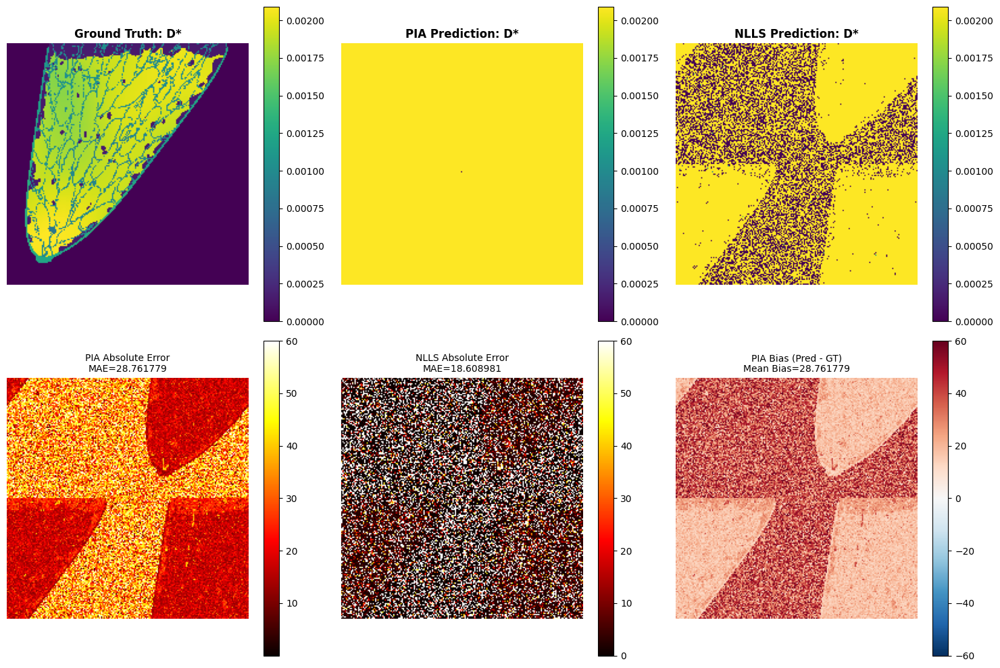

✅ Detaylı Dt haritası kaydedildi: results_0001_Dt_detailed.png


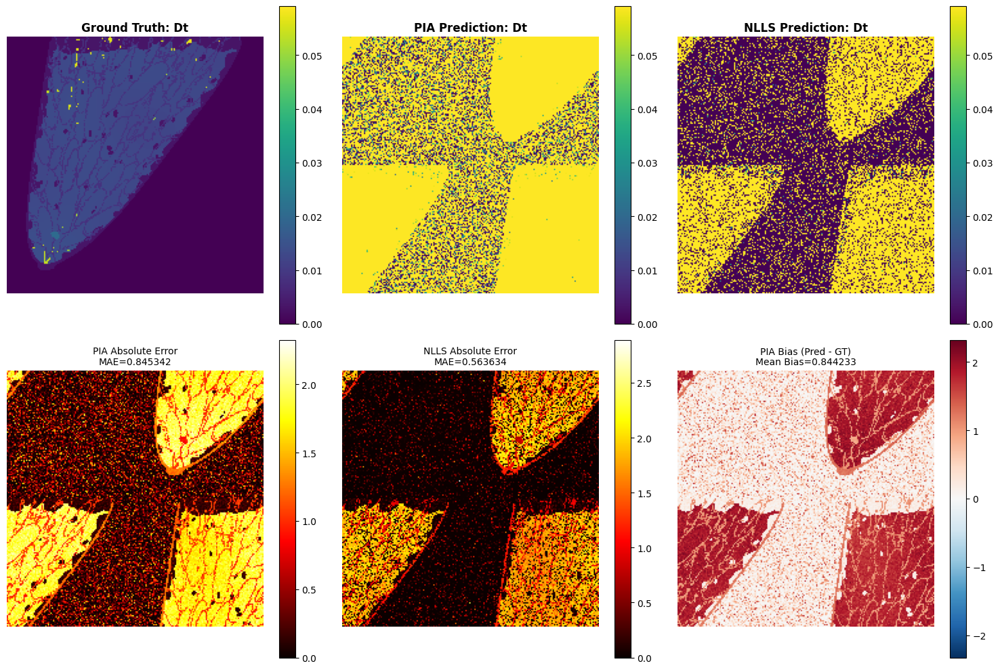

In [17]:
# Her parametre için detaylı görselleştirme
for i, param_name in enumerate(['f', 'D*', 'Dt']):
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    
    # Row 1: GT, PIA, NLLS
    vmin, vmax = gt_params_list[i].min(), gt_params_list[i].max()
    
    im0 = axes[0, 0].imshow(gt_params_list[i], cmap='viridis', vmin=vmin, vmax=vmax)
    axes[0, 0].set_title(f'Ground Truth: {param_name}', fontsize=12, fontweight='bold')
    axes[0, 0].axis('off')
    plt.colorbar(im0, ax=axes[0, 0])
    
    im1 = axes[0, 1].imshow(pia_params_list[i], cmap='viridis', vmin=vmin, vmax=vmax)
    axes[0, 1].set_title(f'PIA Prediction: {param_name}', fontsize=12, fontweight='bold')
    axes[0, 1].axis('off')
    plt.colorbar(im1, ax=axes[0, 1])
    
    im2 = axes[0, 2].imshow(nlls_params_list[i], cmap='viridis', vmin=vmin, vmax=vmax)
    axes[0, 2].set_title(f'NLLS Prediction: {param_name}', fontsize=12, fontweight='bold')
    axes[0, 2].axis('off')
    plt.colorbar(im2, ax=axes[0, 2])
    
    # Row 2: Errors and Bias
    error_pia = np.abs(pia_params_list[i] - gt_params_list[i])
    error_nlls = np.abs(nlls_params_list[i] - gt_params_list[i])
    bias_pia = pia_params_list[i] - gt_params_list[i]
    
    im3 = axes[1, 0].imshow(error_pia, cmap='hot')
    axes[1, 0].set_title(f'PIA Absolute Error\nMAE={error_pia[mask].mean():.6f}', fontsize=10)
    axes[1, 0].axis('off')
    plt.colorbar(im3, ax=axes[1, 0])
    
    im4 = axes[1, 1].imshow(error_nlls, cmap='hot')
    axes[1, 1].set_title(f'NLLS Absolute Error\nMAE={error_nlls[mask].mean():.6f}', fontsize=10)
    axes[1, 1].axis('off')
    plt.colorbar(im4, ax=axes[1, 1])
    
    vmax_bias = max(abs(bias_pia.min()), abs(bias_pia.max()))
    im5 = axes[1, 2].imshow(bias_pia, cmap='RdBu_r', vmin=-vmax_bias, vmax=vmax_bias)
    axes[1, 2].set_title(f'PIA Bias (Pred - GT)\nMean Bias={bias_pia[mask].mean():.6f}', fontsize=10)
    axes[1, 2].axis('off')
    plt.colorbar(im5, ax=axes[1, 2])
    
    plt.tight_layout()
    plt.savefig(f'results_{case_id}_{param_name}_detailed.png', dpi=150, bbox_inches='tight')
    print(f"✅ Detaylı {param_name} haritası kaydedildi: results_{case_id}_{param_name}_detailed.png")
    plt.show()

## 13. Scatter Plotlar (GT vs Prediction)

✅ Scatter plot kaydedildi: results_0001_scatter.png


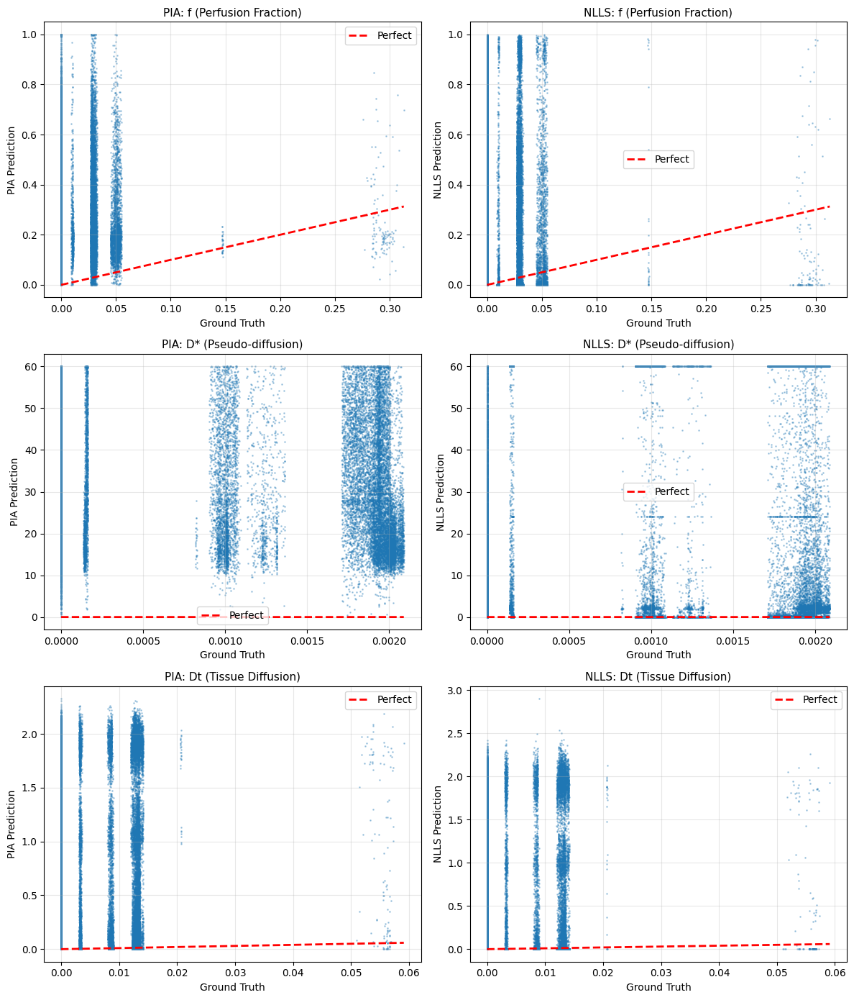

In [18]:
# Scatter plots: Ground Truth vs Predictions
fig, axes = plt.subplots(3, 2, figsize=(12, 14))

mask_flat = mask.flatten()

for i in range(3):
    gt_flat = gt_params_list[i].flatten()[mask_flat]
    pia_flat = pia_params_list[i].flatten()[mask_flat]
    nlls_flat = nlls_params_list[i].flatten()[mask_flat]
    
    # PIA scatter
    axes[i, 0].scatter(gt_flat, pia_flat, alpha=0.3, s=1)
    axes[i, 0].plot([gt_flat.min(), gt_flat.max()], 
                    [gt_flat.min(), gt_flat.max()], 
                    'r--', linewidth=2, label='Perfect')
    axes[i, 0].set_xlabel('Ground Truth', fontsize=10)
    axes[i, 0].set_ylabel('PIA Prediction', fontsize=10)
    axes[i, 0].set_title(f'PIA: {param_names[i]}', fontsize=11)
    axes[i, 0].legend()
    axes[i, 0].grid(True, alpha=0.3)
    
    # NLLS scatter
    axes[i, 1].scatter(gt_flat, nlls_flat, alpha=0.3, s=1)
    axes[i, 1].plot([gt_flat.min(), gt_flat.max()], 
                    [gt_flat.min(), gt_flat.max()], 
                    'r--', linewidth=2, label='Perfect')
    axes[i, 1].set_xlabel('Ground Truth', fontsize=10)
    axes[i, 1].set_ylabel('NLLS Prediction', fontsize=10)
    axes[i, 1].set_title(f'NLLS: {param_names[i]}', fontsize=11)
    axes[i, 1].legend()
    axes[i, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(f'results_{case_id}_scatter.png', dpi=150, bbox_inches='tight')
print(f"✅ Scatter plot kaydedildi: results_{case_id}_scatter.png")
plt.show()

## 14. Sonuçları Kaydet

In [ ]:
# Tüm sonuçları .npz formatında kaydet
output_file = f'predictions_{case_id}.npz'

np.savez(output_file,
         # Predictions
         f_pia=f_pia, Dt_pia=Dt_pia, Dstar_pia=Dstar_pia,
         f_nlls=f_nlls, Dt_nlls=Dt_nlls, Dstar_nlls=Dstar_nlls,
         # Ground truth
         gt_params=gt_params,
         tissue_type=tissue_type,
         # Timing
         pia_time=pia_time,
         nlls_time=nlls_time,
         # Input data
         signals=signals,
         b_values=b_values)

print(f"✅ Tahmin sonuçları kaydedildi: {output_file}")
print(f"\nDosya içeriği:")
print(f"  - PIA tahminleri: f_pia, Dt_pia, Dstar_pia")
print(f"  - NLLS tahminleri: f_nlls, Dt_nlls, Dstar_nlls")
print(f"  - Ground truth: gt_params")
print(f"  - Diğer: tissue_type, signals, b_values, timing")

## 15. Özet

In [ ]:
print("="*80)
print("ÖZET")
print("="*80)

print(f"\n📊 Veri:")
print(f"   Vaka ID: {case_id}")
print(f"   Görüntü boyutu: {signals.shape[0]}x{signals.shape[1]}")
print(f"   B-değer sayısı: {len(b_values)}")
print(f"   Toplam voxel: {np.sum(mask)} (mask uygulandıktan sonra)")

print(f"\n🧠 Model:")
print(f"   PIA checkpoint: {checkpoint_path}")
print(f"   Device: {device}")

print(f"\n⏱️  Performans:")
print(f"   PIA süre:  {pia_time:.2f} saniye")
print(f"   NLLS süre: {nlls_time:.2f} saniye")
print(f"   Hız artışı: {nlls_time/pia_time:.1f}x (PIA)")

print(f"\n📁 Çıktı dosyaları:")
print(f"   - {output_file} (predictions)")
print(f"   - metrics_comparison_{case_id}.csv")
print(f"   - results_{case_id}_comparison.png")
print(f"   - results_{case_id}_errors.png")
print(f"   - results_{case_id}_bias.png")
print(f"   - results_{case_id}_scatter.png")
print(f"   - results_{case_id}_f_detailed.png")
print(f"   - results_{case_id}_D*_detailed.png")
print(f"   - results_{case_id}_Dt_detailed.png")

print(f"\n📊 Özet Metrikler:")
print("-" * 40)
for i, label in enumerate(['f', 'D*', 'Dt']):
    metrics_pia = compute_metrics(pia_params_list[i], gt_params_list[i], mask=mask)
    metrics_nlls = compute_metrics(nlls_params_list[i], gt_params_list[i], mask=mask)
    print(f"\n{label}:")
    print(f"  PIA  - MAE: {metrics_pia['MAE']:.6f}, Bias: {metrics_pia['Bias']:.6f}, Spearman: {metrics_pia['Spearman_Corr']:.4f}")
    print(f"  NLLS - MAE: {metrics_nlls['MAE']:.6f}, Bias: {metrics_nlls['Bias']:.6f}, Spearman: {metrics_nlls['Spearman_Corr']:.4f}")

print("\n" + "="*80)
print("✅ ANALİZ TAMAMLANDI!")
print("="*80)